In [ ]:
!pip install numpy scipy pyscf qiskit pylatexenc qiskit-nature qiskit-aer pyberny

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.6/162.6 kB 1.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.6/48.6 MB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 58.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 40.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 53.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 308.6/308.6 kB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 34.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.7/49.7 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.4/39.4 MB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.5/107.5 kB 5.6 MB/s eta 0:00:00
  Created wheel for pylatexenc: filename=pylatexenc-2.10-py3-none-any.whl size=136817 sha2

# pyscf

In [ ]:
from pyscf import gto
mol = gto.M(
    atom = '''O 0 0 0; H  0 1 0; H 0 0 1''',
    basis = 'sto-3g')

In [ ]:
mol = gto.Mole()
mol.atom = '''
    O   0. 0. 0.
    H   0. 1. 0.
    H   0. 0. 1.
'''
mol.unit = 'B'

# Hamiltonian Preparation

In [ ]:
import numpy as np
from pyscf import ao2mo, gto, scf

def create_integrals_h2_sto3g():
    # create the H2 molecule
    mol = gto.M(
        atom=[
        ("H", [0, 0, 0]),
        ("H", [0, 0, 0.735]),
        ],
        unit="Angstrom",
    basis="sto-3g",
    )
    # do the HF calculation
    hf = scf.RHF(mol)
    hf.kernel()
    # number of electrons (N)
    nelec = mol.nelectron
    # number of orbitals (M)
    norb = hf.mo_coeff.shape[-1]
    # orbital coefficients (C_ji)
    c = hf.mo_coeff
    print(f"nOrb : {norb}")
    print(f"nElec: {nelec}")
    # nuclear repulsion energy E_II
    nuclear = mol.energy_nuc()
    # h^(atom)_ab
    h1atom = hf.get_hcore()
    # hpq = sum_ab C_ap^* C_bq h^(atom)_ab
    # since c is all real (no complex number), we don’t need to conjugate
    hpq = np.einsum("ap,bq,ab->pq", c, c, h1atom)
    use_slow_version = False
    if use_slow_version:
      # SLOW VERSION OF hpqrs
      # hpqrs = sum_abcd C_ap^* C_bq^* C_cr C_ds h^(atom)_abcd
      # PYSCF USES CHEMISTS NOTATION, SO WE NEED TO DO
      # (ps|qr) = sum_adbc C_ap^* C_bq^* C_cr C_ds (ad|bc)^((atom))
      # since c is all real (no complex number), we don’t need to conjugate
      h2atom = mol.intor("int2e")
      hpqrs = np.einsum("ap,bq,cr,ds,adbc->pqrs", c, c, c, c, h2atom)
    else:
      # FASTER VERSION OF hpqrs
      # PYSCF USES CHEMISTS NOTATION, NEED TO CHANGE THE ORDER
      # (ps|qr) -> h_pqrs
      hpqrs = ao2mo.full(mol, c, compact=False).reshape(norb, norb, norb, norb)
      hpqrs = hpqrs.transpose(0, 2, 3, 1)
    return hpq, hpqrs, nuclear, nelec

In [ ]:
def create_integrals_h2o_sto3g():
    # create the H2O molecule
    mol = gto.M(
        atom=[
        ("O", [0, 0, 0]),
        ("H", [0, -0.757, 0.586]),
        ("H", [0, 0.757, 0.586]),
        ],
        unit="Angstrom",
        basis="sto-3g",
    )
    # do the HF calculation
    hf = scf.RHF(mol)
    hf.kernel()
    # number of electrons (N)
    nelec = mol.nelectron
    # number of orbitals (M)
    norb = hf.mo_coeff.shape[-1]
    # orbital coefficients (C_ji)
    c = hf.mo_coeff
    print(f"nOrb : {norb}")
    print(f"nElec: {nelec}")
    # nuclear repulsion energy E_II
    nuclear = mol.energy_nuc()
    # h^(atom)_ab
    h1atom = hf.get_hcore()
    # hpq = sum_ab C_ap^* C_bq h^(atom)_ab
    # since c is all real (no complex number), we don’t need to conjugate
    hpq = np.einsum("ap,bq,ab->pq", c, c, h1atom)
    use_slow_version = False
    if use_slow_version:
      # SLOW VERSION OF hpqrs
      # hpqrs = sum_abcd C_ap^* C_bq^* C_cr C_ds h^(atom)_abcd
      # PYSCF USES CHEMISTS NOTATION, SO WE NEED TO DO
      # (ps|qr) = sum_adbc C_ap^* C_bq^* C_cr C_ds (ad|bc)^((atom))
      # since c is all real (no complex number), we don’t need to conjugate
      h2atom = mol.intor("int2e")
      hpqrs = np.einsum("ap,bq,cr,ds,adbc->pqrs", c, c, c, c, h2atom)
    else:
      # FASTER VERSION OF hpqrs
      # PYSCF USES CHEMISTS NOTATION, NEED TO CHANGE THE ORDER
      # (ps|qr) -> h_pqrs
      hpqrs = ao2mo.full(mol, c, compact=False).reshape(norb, norb, norb, norb)
      hpqrs = hpqrs.transpose(0, 2, 3, 1)
    return hpq, hpqrs, nuclear, nelec


# Encoding

In [ ]:
from qiskit_nature.second_q.mappers import JordanWignerMapper
from qiskit_nature.second_q.operators import FermionicOp

def create_hamiltonian_quantum_circuit(hpq, hpqrs, mapper):
    # NOTE: we exclude the nuclear term here.
    # We just add the nuclear term to the VQE energy afterwards
    n_spatial_orb = hpq.shape[0]
    n_spin_orb = 2 * n_spatial_orb
    fermionic_op_dict = {}

    for spin in range(2):
        # 0 is UP 1 is DW
        for p_spatial_orb in range(n_spatial_orb):
            for q_spatial_orb in range(n_spatial_orb):
                p_spin_orb = spin * n_spatial_orb + p_spatial_orb
                q_spin_orb = spin * n_spatial_orb + q_spatial_orb
                p_qubit = p_spin_orb
                q_qubit = q_spin_orb
                coeff = hpq[p_spatial_orb, q_spatial_orb]
                fermionic_op_dict[f"+_{p_qubit} -_{q_qubit}"] = coeff

    for spin_ps in range(2):
        for spin_qr in range(2):
            for p_spatial_orb in range(n_spatial_orb):
                for q_spatial_orb in range(n_spatial_orb):
                    for r_spatial_orb in range(n_spatial_orb):
                        for s_spatial_orb in range(n_spatial_orb):
                            p_spin_orb = spin_ps * n_spatial_orb + p_spatial_orb
                            q_spin_orb = spin_qr * n_spatial_orb + q_spatial_orb
                            r_spin_orb = spin_qr * n_spatial_orb + r_spatial_orb
                            s_spin_orb = spin_ps * n_spatial_orb + s_spatial_orb
                            p_qubit = p_spin_orb
                            q_qubit = q_spin_orb
                            r_qubit = r_spin_orb
                            s_qubit = s_spin_orb
                            coeff = hpqrs[p_spatial_orb, q_spatial_orb, r_spatial_orb, s_spatial_orb]
                            # multiply by 0.5
                            fermionic_op_dict[f"+_{p_qubit} +_{q_qubit} -_{r_qubit} -_{s_qubit}"] = (coeff * 0.5)

    fermionic_op = FermionicOp(fermionic_op_dict, num_spin_orbitals=n_spin_orb)
    qubit_op = mapper.map(fermionic_op)
    return qubit_op

arr = create_integrals_h2_sto3g()
hamiltonian = create_hamiltonian_quantum_circuit(arr[0], arr[1], JordanWignerMapper())
#hamiltonian.draw("mpl")

converged SCF energy = -1.116998996754
nOrb : 2
nElec: 2


# UCC

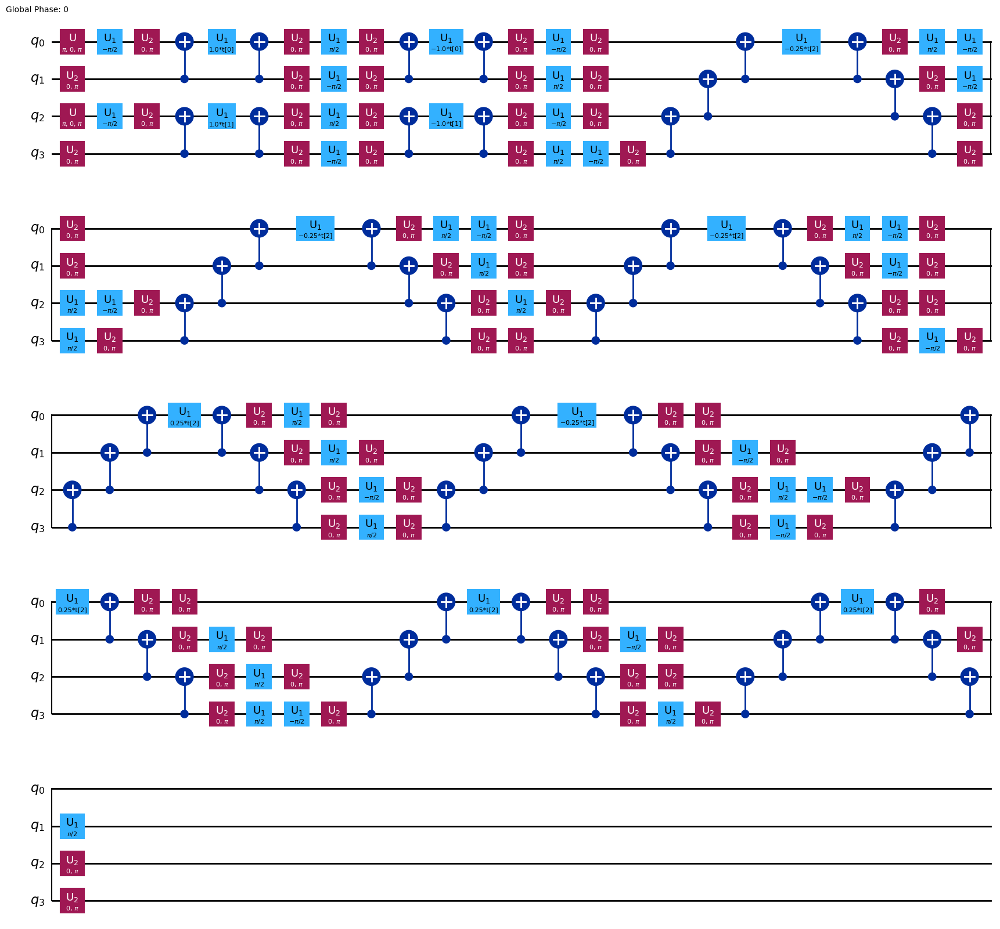

In [ ]:
from qiskit.circuit import QuantumCircuit
from qiskit_nature.second_q.circuit.library import UCC

def make_ucc_ansatz(n_spatial_orb, n_elec, mapper, print_circuit=False):
    n_spin_orb = n_spatial_orb * 2
    n_elec_per_spin = n_elec // 2
    # first create the HF state
    n_qubits = n_spin_orb
    hf = QuantumCircuit(n_qubits)

    for spin in range(2):
        # loop over occupied spatial orbitals
        for p_spatial_orb in range(n_elec_per_spin):
            p_spin_orb = spin * n_spatial_orb + p_spatial_orb
            hf.x(p_spin_orb)

    # num_particles: we need to separate number of spin up and spin down electrons
    # excitations: sd -> singles + doubles
    # qubit_mapper: The Jordan Wigner mapper
    # initial state is HF
    ucc = UCC(
        num_spatial_orbitals=n_spatial_orb,
        num_particles=(n_elec_per_spin, n_elec_per_spin),
        excitations="sd",
        qubit_mapper=mapper,
        initial_state=hf,
    )

    if print_circuit:
        ucc_draw = ucc.decompose().decompose().decompose()
        print(ucc_draw.draw("text"))

    return ucc

UCCtest = make_ucc_ansatz(n_spatial_orb=2, n_elec=2, mapper=JordanWignerMapper())
UCCtest.decompose().decompose().decompose().draw("mpl")

# HEA

     ┌─────────────┐ ░                 ░ ┌─────────────┐ ░                 ░ 
q_0: ┤ R(t[0],π/2) ├─░───■─────────────░─┤ R(t[4],π/2) ├─░───■─────────────░─
     ├─────────────┤ ░ ┌─┴─┐           ░ ├─────────────┤ ░ ┌─┴─┐           ░ 
q_1: ┤ R(t[1],π/2) ├─░─┤ X ├──■────────░─┤ R(t[5],π/2) ├─░─┤ X ├──■────────░─
     ├─────────────┤ ░ └───┘┌─┴─┐      ░ ├─────────────┤ ░ └───┘┌─┴─┐      ░ 
q_2: ┤ R(t[2],π/2) ├─░──────┤ X ├──■───░─┤ R(t[6],π/2) ├─░──────┤ X ├──■───░─
     ├─────────────┤ ░      └───┘┌─┴─┐ ░ ├─────────────┤ ░      └───┘┌─┴─┐ ░ 
q_3: ┤ R(t[3],π/2) ├─░───────────┤ X ├─░─┤ R(t[7],π/2) ├─░───────────┤ X ├─░─
     └─────────────┘ ░           └───┘ ░ └─────────────┘ ░           └───┘ ░ 


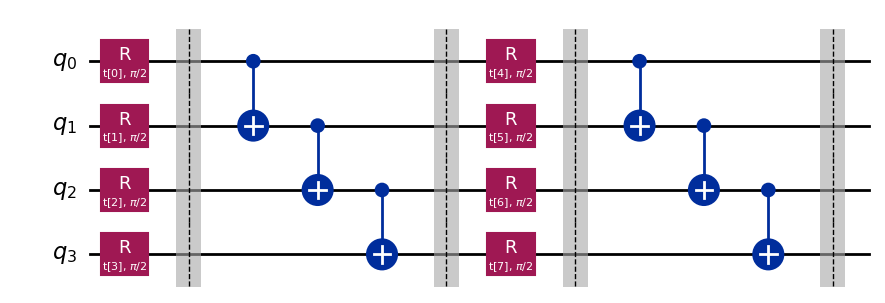

In [ ]:
from qiskit.circuit import ParameterVector, QuantumCircuit

def make_hea_ansatz(n_spatial_orb, reps=2, print_circuit=False):
    n_spin_orb = n_spatial_orb * 2
    n_qubits = n_spin_orb
    n_params = n_qubits * reps
    params = ParameterVector("t", n_params)
    ansatz = QuantumCircuit(n_qubits)
    iparam = 0

    for irep in range(reps):
        for p_spin_orb in range(n_spin_orb):
            ansatz.ry(params[iparam], p_spin_orb)
            iparam += 1
        ansatz.barrier()

        for p_spin_orb in range(n_spin_orb - 1):
            ansatz.cx(p_spin_orb, p_spin_orb + 1)
        ansatz.barrier()

    if print_circuit:
        ansatz_draw = ansatz.decompose()
        print(ansatz_draw.draw("text"))

    return ansatz
HEAtest = make_hea_ansatz(n_spatial_orb=2, reps=2, print_circuit=True)
HEAtest.decompose().draw("mpl")

# VQE Algorithm

In [ ]:
import numpy as np
from qiskit_aer.primitives import Estimator as AerEstimator
from scipy.optimize import minimize
print_circuit = True
def do_vqe(ansatz, hamiltonian, nuclear):
  nparams = ansatz.num_parameters
  # theta: set the inital theta to random
  initial_state = np.random.random(nparams)
  # noiseless simulator
  estimator = AerEstimator(run_options={"shots": None}, approximation=True)
  index = 0
  def get_energy(parameter_values):
    nonlocal index
    result = estimator.run(
      circuits=ansatz, observables=hamiltonian, parameter_values=parameter_values
    ).result()
    #print(ansatz.draw("mpl"))
    energy = result.values[0] + nuclear
    index += 1
    parameter_str = " ".join(f"{e:.4f}" for e in parameter_values)
    print(f"#{index:5d}: {energy:.6f}: {parameter_str}")
    return energy

  res = minimize(fun=get_energy, x0=initial_state, method="bfgs")
  print(f"Energy: {res.fun}")

VQEtest = do_vqe(UCCtest, hamiltonian, arr[2])
#VQEtest.draw("mpl")

#    1: 0.146778: 0.9795 0.7467 0.5278
#    2: 0.146778: 0.9795 0.7467 0.5278
#    3: 0.146778: 0.9795 0.7467 0.5278
#    4: 0.146778: 0.9795 0.7467 0.5278
#    5: -0.050527: 1.1271 0.4352 0.5465
#    6: -0.050527: 1.1271 0.4352 0.5465
#    7: -0.050527: 1.1271 0.4352 0.5465
#    8: -0.050527: 1.1271 0.4352 0.5465
#    9: -0.145761: 1.7175 -0.8107 0.6216
#   10: -0.145761: 1.7175 -0.8107 0.6216
#   11: -0.145761: 1.7175 -0.8107 0.6216
#   12: -0.145761: 1.7175 -0.8107 0.6216
#   13: -0.393081: 1.4390 -0.2231 0.5862
#   14: -0.393081: 1.4390 -0.2231 0.5862
#   15: -0.393081: 1.4390 -0.2231 0.5862
#   16: -0.393081: 1.4390 -0.2231 0.5862
#   17: -0.642068: 1.2332 -0.7678 0.6702
#   18: -0.642068: 1.2332 -0.7678 0.6702
#   19: -0.642068: 1.2332 -0.7678 0.6702
#   20: -0.642068: 1.2332 -0.7678 0.6702
#   21: 0.193911: 0.4099 -2.9469 1.0063
#   22: 0.193911: 0.4099 -2.9469 1.0063
#   23: 0.193911: 0.4099 -2.9469 1.0063
#   24: 0.193911: 0.4099 -2.9469 1.0063
#   25: -0.697381: 1.1483 -0.992

In [ ]:
from qiskit_nature.second_q.mappers import JordanWignerMapper
print_circuit = False
hpq, hpqrs, nuclear, nelec = create_integrals_h2o_sto3g()
mapper = JordanWignerMapper()
hamiltonian = create_hamiltonian_quantum_circuit(hpq, hpqrs, mapper)
#ansatz = make_ucc_ansatz(hpq.shape[0], nelec, mapper, print_circuit=print_circuit)
# OR
ansatz = make_hea_ansatz(hpq.shape[0], print_circuit=print_circuit)
#do_vqe(ansatz, hamiltonian, nuclear)


converged SCF energy = -74.9629466565387
nOrb : 7
nElec: 10


# Active_Space

In [ ]:
from pyscf import ao2mo, lib


# NACT HERE IS SPATIAL ORBITALS, NOT SPIN ORBITALS
def active_space_unpolarized(mf, ncore=0, nact=None):
    einsum = lib.einsum

    if nact is None:
        nact = mf.mo_coeff.shape[1] - ncore

    nuclear = mf.mol.energy_nuc()
    ecore = 0.0

    mo_coeff_core = mf.mo_coeff[:, :ncore]
    mo_coeff_acti = mf.mo_coeff[:, ncore : ncore + nact]

    h1atom = mf.get_hcore()
    if ncore != 0:
        dm_ao_core = 2 * mo_coeff_core @ mo_coeff_core.T
        vj, vk = mf.get_jk(mf.mol, dm_ao_core)
        veff_ao = vj - 0.5 * vk
        ecore += einsum("ij,ji->", dm_ao_core, h1atom + 0.5 * veff_ao)
        h1atom += veff_ao
    hpq = einsum("ap,bq,ab->pq", mo_coeff_acti, mo_coeff_acti, h1atom)
    hpqrs = ao2mo.full(mf.mol, mo_coeff_acti, compact=False).reshape(
        nact, nact, nact, nact
    )
    hpqrs = hpqrs.transpose(0, 2, 3, 1)

    act_nelec = mf.mol.nelectron - ncore * 2

    return nact, act_nelec, nuclear + ecore, hpq, hpqrs


# EXAMPLE
import numpy as np
from pyscf import gto, scf

mol = gto.M(
    atom=[
        ("Li", [0, 0, 0]),
        ("Li", [2.5, 0, 0]),
        ("Li", [5.0, 0, 0]),
        ("Co", [0, 0, 5.0]),
        ("Co", [2.5, 0, 5.0]),
        ("Co", [5.0, 0, 5.0]),
        ("O", [1.25, 1.25, 2.5]),
        ("O", [1.25, -1.25, 2.5]),
        ("O", [-1.25, 1.25, 2.5]),
        ("O", [-1.25, -1.25, 2.5]),
        ("O", [3.75, 1.25, 2.5]),
        ("O", [3.75, -1.25, 2.5]),
    ],
    unit="Angstrom",
    basis="6-31g",
)
# do the HF calculation
hf = scf.RHF(mol)
hf.kernel()

nact, act_nelec, nuclear, hpq, hpqrs = active_space_unpolarized(hf, 4, 4)

# DO VQE HERE
ansatz = make_hea_ansatz(hpq.shape[0], act_nelec, mapper)
ansatz.decompose().decompose().decompose().draw("mpl")
hamiltonian = create_hamiltonian_quantum_circuit(hpq, hpqrs, mapper)
do_vqe(ansatz, hamiltonian, nuclear)

串流輸出內容已截斷至最後 5000 行。
#29767: -1308.213557: 0.0440 -0.2693 0.8478 0.2724 0.5904 0.8259 0.1237 0.3665 0.5948 0.8133 0.8938 -0.4953 1.1181 0.6181 1.2253 0.5816 0.6927 0.0035 0.2587 -0.0042 0.4421 0.9860 -0.0751 0.3949 0.4253 0.7472 -0.0711 1.1064 -0.2839 1.5068 -0.1371 0.1381 0.8107 0.0790 0.0630 0.6854 -0.4469 -0.1146 1.1326 -0.5113 -0.0028 1.1766 -0.0479 0.0217 0.8189 0.5885 0.7181 0.5165 0.0398 0.7927 0.3371 0.7993 1.0619 0.3421 1.0266 1.1566 1.5015 1.3010 0.9319 0.3471 -0.3451 0.8803 -0.1420 0.2604 0.2133 0.0400 0.7878 -0.5049 -0.0631 -0.0996 0.0916 0.2239 -0.2415 1.0575 0.8188 0.6414 -0.2293 0.5667 0.3725 0.4998 0.8524 -0.1528 1.1832 0.4043 -0.4574 0.4572 -0.4754 0.2693 1.1993 0.7055 0.3198 0.2822 0.9287 1.0692 0.7966 0.5487 -0.4972 1.3905 0.3643 0.0904 1.3204 0.9657 1.5465 0.8794 0.1040 0.8054 -0.0688 0.4674 0.2860 0.4898 0.4612 1.2684 0.3956 0.6994 1.2418 1.0258 1.2172 0.7525 0.9775 0.9575 0.3709 0.4776 -0.1995 0.1011 0.3237 -0.2300 0.0738 -0.5112 1.0744 -0.5470 -0.5721 0.5322 0.22

# veq from qiskit doc

In [ ]:
# General imports
import numpy as np

# Pre-defined ansatz circuit and operator class for Hamiltonian
from qiskit.circuit.library import EfficientSU2
from qiskit.quantum_info import SparsePauliOp

# SciPy minimizer routine
from scipy.optimize import minimize

# Plotting functions
import matplotlib.pyplot as plt

In [ ]:
# runtime imports
from qiskit_ibm_runtime import QiskitRuntimeService, Session
from qiskit_ibm_runtime import EstimatorV2 as Estimator



ModuleNotFoundError: No module named 'qiskit_ibm_runtime'

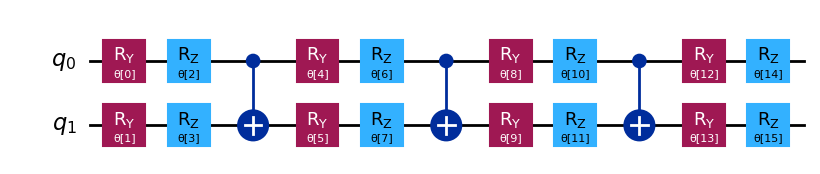

In [ ]:
hamiltonian = SparsePauliOp.from_list(
    [("YZ", 0.3980), ("ZI", -0.3980), ("ZZ", -0.0113), ("XX", 0.1810)]
)
ansatz = EfficientSU2(hamiltonian.num_qubits)
ansatz.decompose().draw("mpl", style="iqp")

# ion battery

The primitive unit cell of LiCoO2 crystal consists of 12 atoms (Li3Co3O6)

In [ ]:
import numpy as np
from pyscf import gto, scf
from pyscf.geomopt import berny_solver
# by chatgpt
mol = gto.M(
    atom=[
        ("Li", [0, 0, 0]),
        ("Co", [0, 0, 4.7]),
        ("O", [1.4, 0, 2.35]),
        ("O", [-1.4, 0, 2.35]),
    ],
    unit="Angstrom",
    basis="sto-3g",
)

In [ ]:
# Initiaize the HF DFT calculation for a periodic system
mf = scf.RHF(mol)
# mf.xc = 'PBE'      # Specify functional
# mf.conv_tol = 1e-8   # Increase SCF convergence tolerance
# mf.max_cycle = 200   # Increase maximum number of SCF cycles

# Perform the SCF calculation
mf.kernel()

# Perform geometry optimization (for molecular-like systems in a unit cell)
mol_eq = berny_solver.optimize(mf, maxsteps=100)

# Print optimized atomic coordinates
print("Optimized atomic coordinates:")
print(mol_eq.atom_coords())

SCF not converged.
SCF energy = -1520.81054210408


INFO:pyscf.geomopt.berny_solver.139618085527968:0 Internal coordinates:
INFO:pyscf.geomopt.berny_solver.139618085527968:0 * Number of fragments: 4
INFO:pyscf.geomopt.berny_solver.139618085527968:0 * Number of internal coordinates: 13
INFO:pyscf.geomopt.berny_solver.139618085527968:0 * Number of weak bonds: 5
INFO:pyscf.geomopt.berny_solver.139618085527968:0 * Number of superweak angles: 8



Geometry optimization cycle 1
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
  Li   0.000000   0.000000   0.000000    0.000000  0.000000  0.000000
  Co   0.000000   0.000000   4.700000    0.000000  0.000000  0.000000
   O   1.400000   0.000000   2.350000    0.000000  0.000000  0.000000
   O  -1.400000   0.000000   2.350000    0.000000  0.000000  0.000000
converged SCF energy = -1520.81061736812
--------------- RHF_Scanner gradients ---------------
         x                y                z
0 Li     0.0000000025    -0.0000000000    -0.0659614640
1 Co     0.0000000011    -0.0000000000     0.0848065476
2 O     0.0312225279     0.0000000000    -0.0094225370
3 O    -0.0312225316     0.0000000000    -0.0094225465
----------------------------------------------
cycle 1: E = -1520.81061737  dE = -1520.81  norm(grad) = 0.11692


INFO:pyscf.geomopt.berny_solver.139618085527968:1 Energy: -1520.81061737
INFO:pyscf.geomopt.berny_solver.139618085527968:1 Pure RFO step was performed:
INFO:pyscf.geomopt.berny_solver.139618085527968:1 * Trust radius: 0.3
INFO:pyscf.geomopt.berny_solver.139618085527968:1 * Number of negative eigenvalues: 0
INFO:pyscf.geomopt.berny_solver.139618085527968:1 * Lowest eigenvalue: 0.157
INFO:pyscf.geomopt.berny_solver.139618085527968:1 * lambda: -0.0232
INFO:pyscf.geomopt.berny_solver.139618085527968:1 Quadratic step: RMS: 0.0761, max: 0.145
INFO:pyscf.geomopt.berny_solver.139618085527968:1 * Predicted energy change: -0.0125
INFO:pyscf.geomopt.berny_solver.139618085527968:1 Total step: RMS: 0.0761, max: 0.145
INFO:pyscf.geomopt.berny_solver.139618085527968:1 Perfect transformation to cartesians in 4 iterations
INFO:pyscf.geomopt.berny_solver.139618085527968:1 * RMS(dcart): 1.52e-08, RMS(dq): 4.45e-08
INFO:pyscf.geomopt.berny_solver.139618085527968:1 Convergence criteria:
INFO:pyscf.geomopt.


Geometry optimization cycle 2
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
  Li  -0.000000   0.000000   0.079491   -0.000000  0.000000  0.079491
  Co  -0.000000   0.000000   4.608652   -0.000000  0.000000 -0.091348
   O   1.412240   0.000000   2.355929    0.012240  0.000000  0.005929
   O  -1.412240   0.000000   2.355929   -0.012240  0.000000  0.005929
converged SCF energy = -1520.83453419201
--------------- RHF_Scanner gradients ---------------
         x                y                z
0 Li    -0.0000000633    -0.0000000000    -0.0694277142
1 Co    -0.0000000615    -0.0000000000     0.0896997356
2 O     0.0377096655     0.0000000000    -0.0101360139
3 O    -0.0377095408     0.0000000000    -0.0101360075
----------------------------------------------
cycle 2: E = -1520.83453419  dE = -0.0239168  norm(grad) = 0.126158


INFO:pyscf.geomopt.berny_solver.139618085527968:2 Energy: -1520.83453419
INFO:pyscf.geomopt.berny_solver.139618085527968:2 Hessian update information:
INFO:pyscf.geomopt.berny_solver.139618085527968:2 * Change: RMS: 0.0251, max: 0.101
INFO:pyscf.geomopt.berny_solver.139618085527968:2 Trust update: Fletcher's parameter: 1.92
INFO:pyscf.geomopt.berny_solver.139618085527968:2 Linear interpolation:
INFO:pyscf.geomopt.berny_solver.139618085527968:2 * Energies: -1520.8345, -1520.8106
INFO:pyscf.geomopt.berny_solver.139618085527968:2 * Derivatives: 0.0245, 0.0232
INFO:pyscf.geomopt.berny_solver.139618085527968:2 * No fit succeeded, staying in new point
INFO:pyscf.geomopt.berny_solver.139618085527968:2 Minimization on sphere was performed:
INFO:pyscf.geomopt.berny_solver.139618085527968:2 * Trust radius: 0.3
INFO:pyscf.geomopt.berny_solver.139618085527968:2 * Number of negative eigenvalues: 1
INFO:pyscf.geomopt.berny_solver.139618085527968:2 * Lowest eigenvalue: -0.0189
INFO:pyscf.geomopt.bern


Geometry optimization cycle 3
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
  Li   0.000000   0.000000   0.163667    0.000000  0.000000  0.084176
  Co   0.000000   0.000000   4.511507    0.000000  0.000000 -0.097145
   O   1.414582   0.000000   2.362413    0.002342  0.000000  0.006484
   O  -1.414583   0.000000   2.362413   -0.002342  0.000000  0.006484
converged SCF energy = -1520.86246725755
--------------- RHF_Scanner gradients ---------------
         x                y                z
0 Li    -0.0000000066    -0.0000000000    -0.0719440048
1 Co    -0.0000000170    -0.0000000001     0.0924198910
2 O     0.0447931573     0.0000000000    -0.0102379546
3 O    -0.0447931337     0.0000000000    -0.0102379317
----------------------------------------------
cycle 3: E = -1520.86246726  dE = -0.0279331  norm(grad) = 0.13394


INFO:pyscf.geomopt.berny_solver.139618085527968:3 Energy: -1520.86246726
INFO:pyscf.geomopt.berny_solver.139618085527968:3 Hessian update information:
INFO:pyscf.geomopt.berny_solver.139618085527968:3 * Change: RMS: 0.00313, max: 0.015
INFO:pyscf.geomopt.berny_solver.139618085527968:3 Trust update: Fletcher's parameter: 0.993
INFO:pyscf.geomopt.berny_solver.139618085527968:3 Linear interpolation:
INFO:pyscf.geomopt.berny_solver.139618085527968:3 * Energies: -1520.8625, -1520.8345
INFO:pyscf.geomopt.berny_solver.139618085527968:3 * Derivatives: 0.0284, 0.0273
INFO:pyscf.geomopt.berny_solver.139618085527968:3 * No fit succeeded, staying in new point
INFO:pyscf.geomopt.berny_solver.139618085527968:3 Minimization on sphere was performed:
INFO:pyscf.geomopt.berny_solver.139618085527968:3 * Trust radius: 0.6
INFO:pyscf.geomopt.berny_solver.139618085527968:3 * Number of negative eigenvalues: 1
INFO:pyscf.geomopt.berny_solver.139618085527968:3 * Lowest eigenvalue: -0.0129
INFO:pyscf.geomopt.be


Geometry optimization cycle 4
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
  Li   0.000000   0.000000   0.327457    0.000000  0.000000  0.163790
  Co   0.000000   0.000000   4.321861    0.000000  0.000000 -0.189646
   O   1.406143   0.000000   2.375341   -0.008439  0.000000  0.012928
   O  -1.406144   0.000000   2.375341    0.008439  0.000000  0.012928
converged SCF energy = -1520.91958222356
--------------- RHF_Scanner gradients ---------------
         x                y                z
0 Li    -0.0000000332    -0.0000000005    -0.0722638751
1 Co    -0.0000000264    -0.0000000013     0.0862981023
2 O     0.0570037610     0.0000000009    -0.0070171051
3 O    -0.0570037015     0.0000000009    -0.0070171221
----------------------------------------------
cycle 4: E = -1520.91958222  dE = -0.057115  norm(grad) = 0.138805


INFO:pyscf.geomopt.berny_solver.139618085527968:4 Energy: -1520.91958222
INFO:pyscf.geomopt.berny_solver.139618085527968:4 Hessian update information:
INFO:pyscf.geomopt.berny_solver.139618085527968:4 * Change: RMS: 0.00784, max: 0.0832
INFO:pyscf.geomopt.berny_solver.139618085527968:4 Trust update: Fletcher's parameter: 0.964
INFO:pyscf.geomopt.berny_solver.139618085527968:4 Linear interpolation:
INFO:pyscf.geomopt.berny_solver.139618085527968:4 * Energies: -1520.9196, -1520.8625
INFO:pyscf.geomopt.berny_solver.139618085527968:4 * Derivatives: 0.0558, 0.057
INFO:pyscf.geomopt.berny_solver.139618085527968:4 * No fit succeeded, staying in new point
INFO:pyscf.geomopt.berny_solver.139618085527968:4 Pure RFO step was performed:
INFO:pyscf.geomopt.berny_solver.139618085527968:4 * Trust radius: 1.2
INFO:pyscf.geomopt.berny_solver.139618085527968:4 * Number of negative eigenvalues: 0
INFO:pyscf.geomopt.berny_solver.139618085527968:4 * Lowest eigenvalue: 0.00198
INFO:pyscf.geomopt.berny_solve


Geometry optimization cycle 5
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
  Li   0.000000   0.000000   0.589600    0.000000  0.000000  0.262143
  Co   0.000000   0.000000   4.020247    0.000000  0.000000 -0.301614
   O   1.369506   0.000000   2.395077   -0.036637  0.000000  0.019736
   O  -1.369507   0.000000   2.395077    0.036637  0.000000  0.019736
converged SCF energy = -1520.99983333092
--------------- RHF_Scanner gradients ---------------
         x                y                z
0 Li    -0.0000000276     0.0000000005    -0.0608870330
1 Co    -0.0000001272     0.0000000008     0.0373828983
2 O     0.0668086663    -0.0000000006     0.0117520127
3 O    -0.0668085115    -0.0000000006     0.0117521219
----------------------------------------------
cycle 5: E = -1520.99983333  dE = -0.0802511  norm(grad) = 0.119615


INFO:pyscf.geomopt.berny_solver.139618085527968:5 Energy: -1520.99983333
INFO:pyscf.geomopt.berny_solver.139618085527968:5 Hessian update information:
INFO:pyscf.geomopt.berny_solver.139618085527968:5 * Change: RMS: 0.00473, max: 0.019
INFO:pyscf.geomopt.berny_solver.139618085527968:5 Trust update: Fletcher's parameter: 0.876
INFO:pyscf.geomopt.berny_solver.139618085527968:5 Linear interpolation:
INFO:pyscf.geomopt.berny_solver.139618085527968:5 * Energies: -1520.9998, -1520.9196
INFO:pyscf.geomopt.berny_solver.139618085527968:5 * Derivatives: 0.0607, 0.0926
INFO:pyscf.geomopt.berny_solver.139618085527968:5 * Quartic interpolation was performed: t = -0.752
INFO:pyscf.geomopt.berny_solver.139618085527968:5 * Interpolated energy: -1521.0251
INFO:pyscf.geomopt.berny_solver.139618085527968:5 Pure RFO step was performed:
INFO:pyscf.geomopt.berny_solver.139618085527968:5 * Trust radius: 1.2
INFO:pyscf.geomopt.berny_solver.139618085527968:5 * Number of negative eigenvalues: 0
INFO:pyscf.geomo


Geometry optimization cycle 6
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
  Li   0.000000   0.000000   0.938910    0.000000  0.000000  0.349310
  Co   0.000000   0.000000   3.650731    0.000000  0.000000 -0.369515
   O   1.262147   0.000000   2.405180   -0.107359  0.000000  0.010103
   O  -1.262148   0.000000   2.405179    0.107359  0.000000  0.010102
converged SCF energy = -1521.02285895707
--------------- RHF_Scanner gradients ---------------
         x                y                z
0 Li     0.0000016126     0.0000000028    -0.0095136536
1 Co    -0.0000237690     0.0000000551    -0.1477782366
2 O     0.0347795258    -0.0000000290     0.0786391235
3 O    -0.0347573695    -0.0000000290     0.0786527667
----------------------------------------------
cycle 6: E = -1521.02285896  dE = -0.0230256  norm(grad) = 0.191617


INFO:pyscf.geomopt.berny_solver.139618085527968:6 Energy: -1521.02285896
INFO:pyscf.geomopt.berny_solver.139618085527968:6 Hessian update information:
INFO:pyscf.geomopt.berny_solver.139618085527968:6 * Change: RMS: 0.0113, max: 0.0483
INFO:pyscf.geomopt.berny_solver.139618085527968:6 Trust update: Fletcher's parameter: 0.882
INFO:pyscf.geomopt.berny_solver.139618085527968:6 Linear interpolation:
INFO:pyscf.geomopt.berny_solver.139618085527968:6 * Energies: -1521.0229, -1520.9998
INFO:pyscf.geomopt.berny_solver.139618085527968:6 * Derivatives: -0.0826, 0.092
INFO:pyscf.geomopt.berny_solver.139618085527968:6 * Quartic interpolation was performed: t = 0.329
INFO:pyscf.geomopt.berny_solver.139618085527968:6 * Interpolated energy: -1521.0357
INFO:pyscf.geomopt.berny_solver.139618085527968:6 Pure RFO step was performed:
INFO:pyscf.geomopt.berny_solver.139618085527968:6 * Trust radius: 1.2
INFO:pyscf.geomopt.berny_solver.139618085527968:6 * Number of negative eigenvalues: 0
INFO:pyscf.geomop


Geometry optimization cycle 7
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
  Li   0.000001   0.000000   0.813934    0.000001  0.000000 -0.124976
  Co   0.000009   0.000000   3.836754    0.000009  0.000000  0.186023
   O   1.260350   0.000000   2.374660   -0.001797  0.000000 -0.030520
   O  -1.260360   0.000000   2.374652    0.001788  0.000000 -0.030527
converged SCF energy = -1521.05402254358
--------------- RHF_Scanner gradients ---------------
         x                y                z
0 Li     0.0000033608     0.0000000009    -0.0390714450
1 Co    -0.0000313417     0.0000001040    -0.0333469244
2 O     0.0675322758    -0.0000000524     0.0361917295
3 O    -0.0675042949    -0.0000000525     0.0362266399
----------------------------------------------
cycle 7: E = -1521.05402254  dE = -0.0311636  norm(grad) = 0.119909


INFO:pyscf.geomopt.berny_solver.139618085527968:7 Energy: -1521.05402254
INFO:pyscf.geomopt.berny_solver.139618085527968:7 Hessian update information:
INFO:pyscf.geomopt.berny_solver.139618085527968:7 * Change: RMS: 0.0167, max: 0.0666
INFO:pyscf.geomopt.berny_solver.139618085527968:7 Trust update: Fletcher's parameter: 2.54
INFO:pyscf.geomopt.berny_solver.139618085527968:7 Linear interpolation:
INFO:pyscf.geomopt.berny_solver.139618085527968:7 * Energies: -1521.054, -1521.0229
INFO:pyscf.geomopt.berny_solver.139618085527968:7 * Derivatives: 0.00761, 0.0588
INFO:pyscf.geomopt.berny_solver.139618085527968:7 * Quartic interpolation was performed: t = -0.204
INFO:pyscf.geomopt.berny_solver.139618085527968:7 * Interpolated energy: -1521.0548
INFO:pyscf.geomopt.berny_solver.139618085527968:7 Pure RFO step was performed:
INFO:pyscf.geomopt.berny_solver.139618085527968:7 * Trust radius: 1.2
INFO:pyscf.geomopt.berny_solver.139618085527968:7 * Number of negative eigenvalues: 0
INFO:pyscf.geomop


Geometry optimization cycle 8
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
  Li   0.000001   0.000000   0.833894    0.000001  0.000000  0.019960
  Co   0.000044   0.000000   3.889863    0.000035  0.000000  0.053109
   O   1.179023   0.000000   2.338145   -0.081327  0.000000 -0.036515
   O  -1.179068   0.000000   2.338098    0.081292  0.000000 -0.036554
converged SCF energy = -1521.08480162359
--------------- RHF_Scanner gradients ---------------
         x                y                z
0 Li    -0.0000023893     0.0000000016    -0.0360506183
1 Co    -0.0000257942     0.0000000056    -0.0135888285
2 O     0.0802412921    -0.0000000036     0.0248081576
3 O    -0.0802131085    -0.0000000036     0.0248312892
----------------------------------------------
cycle 8: E = -1521.08480162  dE = -0.0307791  norm(grad) = 0.124857


INFO:pyscf.geomopt.berny_solver.139618085527968:8 Energy: -1521.08480162
INFO:pyscf.geomopt.berny_solver.139618085527968:8 Hessian update information:
INFO:pyscf.geomopt.berny_solver.139618085527968:8 * Change: RMS: 0.16, max: 0.779
INFO:pyscf.geomopt.berny_solver.139618085527968:8 Trust update: Fletcher's parameter: 1.74
INFO:pyscf.geomopt.berny_solver.139618085527968:8 Linear interpolation:
INFO:pyscf.geomopt.berny_solver.139618085527968:8 * Energies: -1521.0848, -1521.054
INFO:pyscf.geomopt.berny_solver.139618085527968:8 * Derivatives: 0.0308, 0.0307
INFO:pyscf.geomopt.berny_solver.139618085527968:8 * No fit succeeded, staying in new point
INFO:pyscf.geomopt.berny_solver.139618085527968:8 Minimization on sphere was performed:
INFO:pyscf.geomopt.berny_solver.139618085527968:8 * Trust radius: 1.2
INFO:pyscf.geomopt.berny_solver.139618085527968:8 * Number of negative eigenvalues: 1
INFO:pyscf.geomopt.berny_solver.139618085527968:8 * Lowest eigenvalue: -1.81
INFO:pyscf.geomopt.berny_sol


Geometry optimization cycle 9
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
  Li   0.000092   0.000000   0.844767    0.000091  0.000000  0.010873
  Co  -0.000028   0.000000   3.606605   -0.000072  0.000000 -0.283258
   O   1.061043   0.000000   2.474238   -0.117980  0.000000  0.136093
   O  -1.061107   0.000000   2.474391    0.117961  0.000000  0.136293
converged SCF energy = -1520.97082744258
--------------- RHF_Scanner gradients ---------------
         x                y                z
0 Li     0.0000009176     0.0000001989    -0.0208454895
1 Co    -0.0000588006     0.0000015819    -0.3988498159
2 O    -0.0302239297    -0.0000008908     0.2098126422
3 O     0.0302818126    -0.0000008900     0.2098826632
----------------------------------------------
cycle 9: E = -1520.97082744  dE = 0.113974  norm(grad) = 0.499418


INFO:pyscf.geomopt.berny_solver.139618085527968:9 Energy: -1520.97082744
INFO:pyscf.geomopt.berny_solver.139618085527968:9 Hessian update information:
INFO:pyscf.geomopt.berny_solver.139618085527968:9 * Change: RMS: 0.161, max: 0.795
INFO:pyscf.geomopt.berny_solver.139618085527968:9 Trust update: Fletcher's parameter: -0.0864
INFO:pyscf.geomopt.berny_solver.139618085527968:9 Linear interpolation:
INFO:pyscf.geomopt.berny_solver.139618085527968:9 * Energies: -1520.9708, -1521.0848
INFO:pyscf.geomopt.berny_solver.139618085527968:9 * Derivatives: -0.328, 0.014
INFO:pyscf.geomopt.berny_solver.139618085527968:9 * Quartic interpolation was performed: t = 0.896
INFO:pyscf.geomopt.berny_solver.139618085527968:9 * Interpolated energy: -1521.0856
INFO:pyscf.geomopt.berny_solver.139618085527968:9 Minimization on sphere was performed:
INFO:pyscf.geomopt.berny_solver.139618085527968:9 * Trust radius: 0.3
INFO:pyscf.geomopt.berny_solver.139618085527968:9 * Number of negative eigenvalues: 0
INFO:pysc


Geometry optimization cycle 10
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
  Li   0.000014   0.000000   0.846869   -0.000078  0.000000  0.002102
  Co   0.000062   0.000000   3.897732    0.000090  0.000000  0.291127
   O   1.112348   0.000000   2.327727    0.051305  0.000000 -0.146511
   O  -1.112424   0.000000   2.327673   -0.051317  0.000000 -0.146718
converged SCF energy = -1521.10801384017
--------------- RHF_Scanner gradients ---------------
         x                y                z
0 Li    -0.0000068708     0.0000000549    -0.0311031346
1 Co    -0.0000170663     0.0000000788    -0.0160596733
2 O     0.0884906172    -0.0000000669     0.0235806012
3 O    -0.0884666800    -0.0000000668     0.0235822067
----------------------------------------------
cycle 10: E = -1521.10801384  dE = -0.137186  norm(grad) = 0.134143


INFO:pyscf.geomopt.berny_solver.139618085527968:10 Energy: -1521.10801384
INFO:pyscf.geomopt.berny_solver.139618085527968:10 Hessian update information:
INFO:pyscf.geomopt.berny_solver.139618085527968:10 * Change: RMS: 0.0201, max: 0.1
INFO:pyscf.geomopt.berny_solver.139618085527968:10 Trust update: Fletcher's parameter: 6.18
INFO:pyscf.geomopt.berny_solver.139618085527968:10 Linear interpolation:
INFO:pyscf.geomopt.berny_solver.139618085527968:10 * Energies: -1521.108, -1521.0848
INFO:pyscf.geomopt.berny_solver.139618085527968:10 * Derivatives: 0.0242, 0.0223
INFO:pyscf.geomopt.berny_solver.139618085527968:10 * No fit succeeded, staying in new point
INFO:pyscf.geomopt.berny_solver.139618085527968:10 Minimization on sphere was performed:
INFO:pyscf.geomopt.berny_solver.139618085527968:10 * Trust radius: 0.6
INFO:pyscf.geomopt.berny_solver.139618085527968:10 * Number of negative eigenvalues: 1
INFO:pyscf.geomopt.berny_solver.139618085527968:10 * Lowest eigenvalue: -0.0207
INFO:pyscf.geo


Geometry optimization cycle 11
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
  Li   0.000031   0.000000   0.857959    0.000017  0.000000  0.011090
  Co   0.000090   0.000000   3.943332    0.000029  0.000000  0.045600
   O   0.990280   0.000000   2.299385   -0.122069  0.000000 -0.028342
   O  -0.990401   0.000000   2.299324    0.122023  0.000000 -0.028348
converged SCF energy = -1521.15699489523
--------------- RHF_Scanner gradients ---------------
         x                y                z
0 Li    -0.0000056183     0.0000000235    -0.0165416275
1 Co    -0.0000079854     0.0000000125     0.0003677260
2 O     0.1118353583    -0.0000000181     0.0080904077
3 O    -0.1118217546    -0.0000000180     0.0080834938
----------------------------------------------
cycle 11: E = -1521.1569949  dE = -0.0489811  norm(grad) = 0.159423


INFO:pyscf.geomopt.berny_solver.139618085527968:11 Energy: -1521.1569949
INFO:pyscf.geomopt.berny_solver.139618085527968:11 Hessian update information:
INFO:pyscf.geomopt.berny_solver.139618085527968:11 * Change: RMS: 0.00611, max: 0.0177
INFO:pyscf.geomopt.berny_solver.139618085527968:11 Trust update: Fletcher's parameter: 1.0
INFO:pyscf.geomopt.berny_solver.139618085527968:11 Linear interpolation:
INFO:pyscf.geomopt.berny_solver.139618085527968:11 * Energies: -1521.157, -1521.108
INFO:pyscf.geomopt.berny_solver.139618085527968:11 * Derivatives: 0.0528, 0.0454
INFO:pyscf.geomopt.berny_solver.139618085527968:11 * No fit succeeded, staying in new point
INFO:pyscf.geomopt.berny_solver.139618085527968:11 Minimization on sphere was performed:
INFO:pyscf.geomopt.berny_solver.139618085527968:11 * Trust radius: 1.2
INFO:pyscf.geomopt.berny_solver.139618085527968:11 * Number of negative eigenvalues: 1
INFO:pyscf.geomopt.berny_solver.139618085527968:11 * Lowest eigenvalue: -0.0764
INFO:pyscf.ge


Geometry optimization cycle 12
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
  Li   0.000100   0.000000   0.814074    0.000068  0.000000 -0.043885
  Co   0.000079   0.000000   3.895462   -0.000011  0.000000 -0.047870
   O   0.747027   0.000000   2.345201   -0.243253  0.000000  0.045816
   O  -0.747206   0.000000   2.345262    0.243196  0.000000  0.045938
converged SCF energy = -1521.24546217506
--------------- RHF_Scanner gradients ---------------
         x                y                z
0 Li     0.0000178291     0.0000000054    -0.0173843391
1 Co     0.0000041803    -0.0000000351    -0.0996775510
2 O     0.0353271408     0.0000000148     0.0585262201
3 O    -0.0353491502     0.0000000148     0.0585356700
----------------------------------------------
cycle 12: E = -1521.24546218  dE = -0.0884673  norm(grad) = 0.139954


INFO:pyscf.geomopt.berny_solver.139618085527968:12 Energy: -1521.24546218
INFO:pyscf.geomopt.berny_solver.139618085527968:12 Hessian update information:
INFO:pyscf.geomopt.berny_solver.139618085527968:12 * Change: RMS: 0.013, max: 0.0518
INFO:pyscf.geomopt.berny_solver.139618085527968:12 Trust update: Fletcher's parameter: 0.606
INFO:pyscf.geomopt.berny_solver.139618085527968:12 Linear interpolation:
INFO:pyscf.geomopt.berny_solver.139618085527968:12 * Energies: -1521.2455, -1521.157
INFO:pyscf.geomopt.berny_solver.139618085527968:12 * Derivatives: 0.0101, 0.0998
INFO:pyscf.geomopt.berny_solver.139618085527968:12 * No fit succeeded, staying in new point
INFO:pyscf.geomopt.berny_solver.139618085527968:12 Pure RFO step was performed:
INFO:pyscf.geomopt.berny_solver.139618085527968:12 * Trust radius: 1.2
INFO:pyscf.geomopt.berny_solver.139618085527968:12 * Number of negative eigenvalues: 0
INFO:pyscf.geomopt.berny_solver.139618085527968:12 * Lowest eigenvalue: 0.00234
INFO:pyscf.geomopt.b


Geometry optimization cycle 13
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
  Li   0.000063   0.000000   0.844334   -0.000037  0.000000  0.030260
  Co   0.000122   0.000000   4.068334    0.000043  0.000000  0.172872
   O   0.621046   0.000000   2.243699   -0.125980  0.000000 -0.101502
   O  -0.621231   0.000000   2.243633    0.125975  0.000000 -0.101629
converged SCF energy = -1521.19250712357
--------------- RHF_Scanner gradients ---------------
         x                y                z
0 Li     0.0000075067     0.0000000022     0.0692163002
1 Co     0.0000189141    -0.0000000293     0.0414254240
2 O    -0.3662792757     0.0000000135    -0.0553401654
3 O     0.3662528548     0.0000000136    -0.0553015588
----------------------------------------------
cycle 13: E = -1521.19250712  dE = 0.0529551  norm(grad) = 0.530028


INFO:pyscf.geomopt.berny_solver.139618085527968:13 Energy: -1521.19250712
INFO:pyscf.geomopt.berny_solver.139618085527968:13 Hessian update information:
INFO:pyscf.geomopt.berny_solver.139618085527968:13 * Change: RMS: 0.035, max: 0.241
INFO:pyscf.geomopt.berny_solver.139618085527968:13 Trust update: Fletcher's parameter: -0.757
INFO:pyscf.geomopt.berny_solver.139618085527968:13 Linear interpolation:
INFO:pyscf.geomopt.berny_solver.139618085527968:13 * Energies: -1521.1925, -1521.2455
INFO:pyscf.geomopt.berny_solver.139618085527968:13 * Derivatives: -0.216, 0.0741
INFO:pyscf.geomopt.berny_solver.139618085527968:13 * Quartic interpolation was performed: t = 0.663
INFO:pyscf.geomopt.berny_solver.139618085527968:13 * Interpolated energy: -1521.2586
INFO:pyscf.geomopt.berny_solver.139618085527968:13 Minimization on sphere was performed:
INFO:pyscf.geomopt.berny_solver.139618085527968:13 * Trust radius: 0.24
INFO:pyscf.geomopt.berny_solver.139618085527968:13 * Number of negative eigenvalues


Geometry optimization cycle 14
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
  Li   0.000063   0.000000   0.812061   -0.000000  0.000000 -0.032273
  Co   0.000082   0.000000   4.002403   -0.000040  0.000000 -0.065931
   O   0.737526   0.000000   2.292764    0.116480  0.000000  0.049064
   O  -0.737671   0.000000   2.292772   -0.116440  0.000000  0.049139
converged SCF energy = -1521.26034184075
--------------- RHF_Scanner gradients ---------------
         x                y                z
0 Li     0.0000125382     0.0000000012    -0.0007310913
1 Co     0.0000087421    -0.0000000270     0.0048175391
2 O     0.0300492560     0.0000000129    -0.0020478548
3 O    -0.0300705362     0.0000000129    -0.0020385929
----------------------------------------------
cycle 14: E = -1521.26034184  dE = -0.0678347  norm(grad) = 0.0428869


INFO:pyscf.geomopt.berny_solver.139618085527968:14 Energy: -1521.26034184
INFO:pyscf.geomopt.berny_solver.139618085527968:14 Hessian update information:
INFO:pyscf.geomopt.berny_solver.139618085527968:14 * Change: RMS: 0.0269, max: 0.198
INFO:pyscf.geomopt.berny_solver.139618085527968:14 Trust update: Fletcher's parameter: 4.44
INFO:pyscf.geomopt.berny_solver.139618085527968:14 Linear interpolation:
INFO:pyscf.geomopt.berny_solver.139618085527968:14 * Energies: -1521.2603, -1521.2455
INFO:pyscf.geomopt.berny_solver.139618085527968:14 * Derivatives: -0.000185, 0.0329
INFO:pyscf.geomopt.berny_solver.139618085527968:14 * Quartic interpolation was performed: t = 0.0075
INFO:pyscf.geomopt.berny_solver.139618085527968:14 * Interpolated energy: -1521.2603
INFO:pyscf.geomopt.berny_solver.139618085527968:14 Pure RFO step was performed:
INFO:pyscf.geomopt.berny_solver.139618085527968:14 * Trust radius: 0.47
INFO:pyscf.geomopt.berny_solver.139618085527968:14 * Number of negative eigenvalues: 0
IN


Geometry optimization cycle 15
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
  Li   0.000051   0.000000   0.813367   -0.000012  0.000000  0.001306
  Co   0.000073   0.000000   3.997678   -0.000009  0.000000 -0.004725
   O   0.696391   0.000000   2.294475   -0.041136  0.000000  0.001712
   O  -0.696514   0.000000   2.294479    0.041157  0.000000  0.001707
converged SCF energy = -1521.25838607582
--------------- RHF_Scanner gradients ---------------
         x                y                z
0 Li     0.0000111640     0.0000000015     0.0055843217
1 Co     0.0000093670    -0.0000000279    -0.0032559145
2 O    -0.0620765981     0.0000000132    -0.0011663855
3 O     0.0620560671     0.0000000132    -0.0011620217
----------------------------------------------
cycle 15: E = -1521.25838608  dE = 0.00195576  norm(grad) = 0.0880282


INFO:pyscf.geomopt.berny_solver.139618085527968:15 Energy: -1521.25838608
INFO:pyscf.geomopt.berny_solver.139618085527968:15 Hessian update information:
INFO:pyscf.geomopt.berny_solver.139618085527968:15 * Change: RMS: 0.0207, max: 0.19
INFO:pyscf.geomopt.berny_solver.139618085527968:15 Trust update: Fletcher's parameter: -0.795
INFO:pyscf.geomopt.berny_solver.139618085527968:15 Linear interpolation:
INFO:pyscf.geomopt.berny_solver.139618085527968:15 * Energies: -1521.2584, -1521.2603
INFO:pyscf.geomopt.berny_solver.139618085527968:15 * Derivatives: -0.00968, 0.00474
INFO:pyscf.geomopt.berny_solver.139618085527968:15 * Quartic interpolation was performed: t = 0.621
INFO:pyscf.geomopt.berny_solver.139618085527968:15 * Interpolated energy: -1521.2613
INFO:pyscf.geomopt.berny_solver.139618085527968:15 Pure RFO step was performed:
INFO:pyscf.geomopt.berny_solver.139618085527968:15 * Trust radius: 0.049
INFO:pyscf.geomopt.berny_solver.139618085527968:15 * Number of negative eigenvalues: 0
I


Geometry optimization cycle 16
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
  Li   0.000037   0.000000   0.810573   -0.000014  0.000000 -0.002794
  Co   0.000059   0.000000   3.999229   -0.000013  0.000000  0.001551
   O   0.724047   0.000000   2.295096    0.027656  0.000000  0.000620
   O  -0.724144   0.000000   2.295102   -0.027630  0.000000  0.000623
converged SCF energy = -1521.26125925766
--------------- RHF_Scanner gradients ---------------
         x                y                z
0 Li     0.0000081651     0.0000000017    -0.0002471039
1 Co     0.0000063212    -0.0000000255     0.0005728877
2 O     0.0042620785     0.0000000119    -0.0001648053
3 O    -0.0042765648     0.0000000119    -0.0001609786
----------------------------------------------
cycle 16: E = -1521.26125926  dE = -0.00287318  norm(grad) = 0.00607427


INFO:pyscf.geomopt.berny_solver.139618085527968:16 Energy: -1521.26125926
INFO:pyscf.geomopt.berny_solver.139618085527968:16 Hessian update information:
INFO:pyscf.geomopt.berny_solver.139618085527968:16 * Change: RMS: 0.00414, max: 0.0365
INFO:pyscf.geomopt.berny_solver.139618085527968:16 Trust update: Fletcher's parameter: 97.1
INFO:pyscf.geomopt.berny_solver.139618085527968:16 Linear interpolation:
INFO:pyscf.geomopt.berny_solver.139618085527968:16 * Energies: -1521.2613, -1521.2603
INFO:pyscf.geomopt.berny_solver.139618085527968:16 * Derivatives: 0.000222, 0.00158
INFO:pyscf.geomopt.berny_solver.139618085527968:16 * Quartic interpolation was performed: t = -0.151
INFO:pyscf.geomopt.berny_solver.139618085527968:16 * Interpolated energy: -1521.2613
INFO:pyscf.geomopt.berny_solver.139618085527968:16 Pure RFO step was performed:
INFO:pyscf.geomopt.berny_solver.139618085527968:16 * Trust radius: 0.049
INFO:pyscf.geomopt.berny_solver.139618085527968:16 * Number of negative eigenvalues: 0


Geometry optimization cycle 17
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
  Li   0.000019   0.000000   0.810633   -0.000018  0.000000  0.000060
  Co   0.000044   0.000000   3.998736   -0.000015  0.000000 -0.000493
   O   0.721844   0.000000   2.295312   -0.002203  0.000000  0.000217
   O  -0.721907   0.000000   2.295318    0.002237  0.000000  0.000216
converged SCF energy = -1521.26127597455
--------------- RHF_Scanner gradients ---------------
         x                y                z
0 Li     0.0000050204     0.0000000023     0.0000324919
1 Co     0.0000041776    -0.0000000247    -0.0000489413
2 O    -0.0003844737     0.0000000112     0.0000076090
3 O     0.0003752757     0.0000000112     0.0000088404
----------------------------------------------
cycle 17: E = -1521.26127597  dE = -1.67169e-05  norm(grad) = 0.000540631


INFO:pyscf.geomopt.berny_solver.139618085527968:17 Energy: -1521.26127597
INFO:pyscf.geomopt.berny_solver.139618085527968:17 Hessian update information:
INFO:pyscf.geomopt.berny_solver.139618085527968:17 * Change: RMS: 0.00233, max: 0.0205
INFO:pyscf.geomopt.berny_solver.139618085527968:17 Trust update: Fletcher's parameter: 80.1
INFO:pyscf.geomopt.berny_solver.139618085527968:17 Linear interpolation:
INFO:pyscf.geomopt.berny_solver.139618085527968:17 * Energies: -1521.2613, -1521.2613
INFO:pyscf.geomopt.berny_solver.139618085527968:17 * Derivatives: -3.24e-06, 3.65e-05
INFO:pyscf.geomopt.berny_solver.139618085527968:17 * Quartic interpolation was performed: t = 0.0807
INFO:pyscf.geomopt.berny_solver.139618085527968:17 * Interpolated energy: -1521.2613
INFO:pyscf.geomopt.berny_solver.139618085527968:17 Pure RFO step was performed:
INFO:pyscf.geomopt.berny_solver.139618085527968:17 * Trust radius: 0.049
INFO:pyscf.geomopt.berny_solver.139618085527968:17 * Number of negative eigenvalues:

Optimized atomic coordinates:
[[ 3.66437345e-05  0.00000000e+00  1.53187528e+00]
 [ 8.33619921e-05  0.00000000e+00  7.55651601e+00]
 [ 1.36408677e+00  0.00000000e+00  4.33751133e+00]
 [-1.36420677e+00  0.00000000e+00  4.33752295e+00]]


In [ ]:
!pip install pyberny
!pip install pyscf
!pip install geometric
# !pip install mcscf

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 385.0/385.0 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for geometric: filename=geometric-1.0.2-py3-none-any.whl size=397151 sha256=1a6013d6d1472d8bda1e8ef0b519c04ade1c69f8d8a8e901db8ff9a5c66e92e1
  Stored in directory: /root/.cache/pip/wheels/a6/9a/7c/4a37604d74a279118623fceb5b2d96742d857f034d8c588f46
Successfully built geometric


In [ ]:
# from pyscf import gto, scf
# from pyscf.geomopt import berny_solver

# # 定義 Li3Co3O6 的初始結構
# mol = gto.M(
#     atom=[
#         ("Li", [0, 0, 0]),
#         ("Li", [2.5, 0, 0]),
#         ("Li", [5.0, 0, 0]),
#         ("Co", [0, 0, 5.0]),
#         ("Co", [2.5, 0, 5.0]),
#         ("Co", [5.0, 0, 5.0]),
#         ("O", [1.25, 1.25, 2.5]),
#         ("O", [1.25, -1.25, 2.5]),
#         ("O", [-1.25, 1.25, 2.5]),
#         ("O", [-1.25, -1.25, 2.5]),
#         ("O", [3.75, 1.25, 2.5]),
#         ("O", [3.75, -1.25, 2.5]),
#     ],
#     unit="Angstrom",
#     basis="6-31g*",  # 使用較高級別的基組
# )

# # 使用 Hartree-Fock 方法
# mf = scf.RHF(mol)
# mf.conv_tol = 1e-8  # 增加 SCF 收斂標準
# mf.max_cycle = 200  # 增加最大循環次數

# # 使用 Berny 優化器進行幾何優化
# mol_eq = berny_solver.optimize(mf)

# # 輸出優化後的原子坐標
# print("優化後的原子坐標:")
# print(mol_eq.atom_coords())


INFO:pyscf.geomopt.berny_solver.136213375584288:0 Internal coordinates:
INFO:pyscf.geomopt.berny_solver.136213375584288:0 * Number of fragments: 8
INFO:pyscf.geomopt.berny_solver.136213375584288:0 * Number of internal coordinates: 179
INFO:pyscf.geomopt.berny_solver.136213375584288:0 * Number of strong bonds: 4
INFO:pyscf.geomopt.berny_solver.136213375584288:0 * Number of weak bonds: 27
INFO:pyscf.geomopt.berny_solver.136213375584288:0 * Number of strong angles: 2
INFO:pyscf.geomopt.berny_solver.136213375584288:0 * Number of weak angles: 28
INFO:pyscf.geomopt.berny_solver.136213375584288:0 * Number of superweak angles: 110
INFO:pyscf.geomopt.berny_solver.136213375584288:0 * Number of weak dihedrals: 8



Geometry optimization cycle 1
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
  Li   0.000000   0.000000   0.000000    0.000000  0.000000  0.000000
  Li   2.500000   0.000000   0.000000    0.000000  0.000000  0.000000
  Li   5.000000   0.000000   0.000000    0.000000  0.000000  0.000000
  Co   0.000000   0.000000   5.000000    0.000000  0.000000  0.000000
  Co   2.500000   0.000000   5.000000    0.000000  0.000000  0.000000
  Co   5.000000   0.000000   5.000000    0.000000  0.000000  0.000000
   O   1.250000   1.250000   2.500000    0.000000  0.000000  0.000000
   O   1.250000  -1.250000   2.500000    0.000000  0.000000  0.000000
   O  -1.250000   1.250000   2.500000    0.000000  0.000000  0.000000
   O  -1.250000  -1.250000   2.500000    0.000000  0.000000  0.000000
   O   3.750000   1.250000   2.500000    0.000000  0.000000  0.000000
   O   3.750000  -1.250000   2.500000    0.000000  0.000000  0.000000
SCF not converged.
SCF energy = 

In [ ]:
import numpy as np
from pyscf.pbc import gto, scf, dft
from pyscf.geomopt import berny_solver

cell = gto.M(
  atom=[
      ("Li", [0, 0, 0]),
      ("Co", [0, 0, 4.7]),
      ("O", [1.4, 0, 2.35]),
      ("O", [-1.4, 0, 2.35]),
    ],
  unit="Angstrom",
  basis='6-31g',
  pseudo='gth-pbe',
  a = [
      [5.6738, 0, 0],
      [0, 5.6738, 0],
      [0, 0, 14.1670]
  ]
)
kpts = cell.make_kpts([2,2,2])

# Initiaize the Kohn-Sham DFT calculation for a periodic system
mf = scf.RHF(cell)  # K-space restricted Kohn-Sham DFT
# mf.xc = 'PBE'      # Specify functional
# mf.conv_tol = 1e-8   # Increase SCF convergence tolerance
# mf.max_cycle = 200   # Increase maximum number of SCF cycles

# Perform the SCF calculation
mf.kernel()

# Perform geometry optimization (for molecular-like systems in a unit cell)
mol_eq = berny_solver.optimize(mf, maxsteps=100)

# Print optimized atomic coordinates
print("Optimized atomic coordinates:")
print(mol_eq.atom_coords())


WARNING!
  Very diffused basis functions are found in the basis set. They may lead to severe
  linear dependence and numerical instability.  You can set  cell.exp_to_discard=0.1
  to remove the diffused Gaussians whose exponents are less than 0.1.



In [ ]:
import numpy as np
from pyscf.pbc import gto, scf, dft
from pyscf.geomopt import berny_solver

# Define the periodic cell
cell = gto.Cell()
cell.atom = '''H 0 0 0; H 1 1 1'''
cell.basis = 'gth-dzvp'
cell.pseudo = 'gth-lda'
cell.a = np.eye(3) * 2  # Define the lattice vectors
cell.build()

# Initiaize the Kohn-Sham DFT calculation for a periodic system
mf = dft.RHF(cell)  # K-space restricted Kohn-Sham DFT
mf.xc = 'pbe'      # Specify functional
# mf.conv_tol = 1e-8   # Increase SCF convergence tolerance
# mf.max_cycle = 200   # Increase maximum number of SCF cycles

# Perform the SCF calculation
mf.kernel()

# Perform geometry optimization (for molecular-like systems in a unit cell)
mol_eq = berny_solver.optimize(mf)

# Print optimized atomic coordinates
print("Optimized atomic coordinates:")
print(mol_eq.atom_coords())


AttributeError: module 'pyscf.pbc.dft' has no attribute 'RHF'

In [ ]:
from pyscf import gto, scf
from pyscf.geomopt import berny_solver

# 定義 Li3Co3O6 的初始結構
mol = gto.M(
    atom=[
        ("Li", [0, 0, 0]),
        ("Li", [2.5, 0, 0]),
        ("Li", [5.0, 0, 0]),
        ("Co", [0, 0, 5.0]),
        ("Co", [2.5, 0, 5.0]),
        ("Co", [5.0, 0, 5.0]),
        ("O", [1.25, 1.25, 2.5]),
        ("O", [1.25, -1.25, 2.5]),
        ("O", [-1.25, 1.25, 2.5]),
        ("O", [-1.25, -1.25, 2.5]),
        ("O", [3.75, 1.25, 2.5]),
        ("O", [3.75, -1.25, 2.5]),
    ],
    unit="Angstrom",
    basis="6-31g*",  # 使用較高級別的基組
)

# 使用 DFT 方法 (B3LYP 泛函)
mf = scf.RKS(mol)
mf.xc = 'b3lyp'  # 指定 B3LYP 泛函
mf.conv_tol = 1e-8  # 增加 SCF 收斂標準
mf.max_cycle = 200  # 增加最大循環次數

mf.kernel()

# 使用 Berny 優化器進行幾何優化
mol_eq = berny_solver.optimize(mf)

# 輸出優化後的原子坐標
print("優化後的原子坐標:")
print(mol_eq.atom_coords())


SCF not converged.
SCF energy = -4580.02629515151


0 Internal coordinates:0 * Number of fragments: 80 * Number of internal coordinates: 1790 * Number of strong bonds: 40 * Number of weak bonds: 270 * Number of strong angles: 20 * Number of weak angles: 280 * Number of superweak angles: 1100 * Number of weak dihedrals: 8


Geometry optimization cycle 1
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
  Li   0.000000   0.000000   0.000000    0.000000  0.000000  0.000000
  Li   2.500000   0.000000   0.000000    0.000000  0.000000  0.000000
  Li   5.000000   0.000000   0.000000    0.000000  0.000000  0.000000
  Co   0.000000   0.000000   5.000000    0.000000  0.000000  0.000000
  Co   2.500000   0.000000   5.000000    0.000000  0.000000  0.000000
  Co   5.000000   0.000000   5.000000    0.000000  0.000000  0.000000
   O   1.250000   1.250000   2.500000    0.000000  0.000000  0.000000
   O   1.250000  -1.250000   2.500000    0.000000  0.000000  0.000000
   O  -1.250000   1.250000   2.500000    0.000000  0.000000  0.000000
   O  -1.250000  -1.250000   2.500000    0.000000  0.000000  0.000000
   O   3.750000   1.250000   2.500000    0.000000  0.000000  0.000000
   O   3.750000  -1.250000   2.500000    0.000000  0.000000  0.000000
